<a href="https://colab.research.google.com/github/GBANIAKI/BlueQubit-Hackathon-October-2024/blob/main/circuit_1Solution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# BlueQubit Hackathon October 2024 #

## **Tasks Details:** ##
### The Goal is to solve the circuit given as **circuit_1_30q_fixed.qasm** file and find the hidden bitstring. This circuit prepares a quantum state that has one bitstring with O(1) probability while every other bitsrting has a significantly ( exponentially) smaller probability ###

## **Tools**:
### **BlueQubit** Platform ###

## **Solution** ##


1.   Load the circuit_1_30q_fixed.qasm into a quantum circuit
2.   Draw the circuit
3.   Build an BQClient instance for managing Jobs on the **BlueQubit** platform
4.   Run the circuit and retrieve the job result
5.   Check Jobs current status
6.   Retrieve the measurement probabilities of the construction result
7.   Plot the top 100 bitstrings with the highest probabilities to see  if the hidden bitsring was the mode.





In [ ]:
!pip install bluequbit


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.4/41.4 kB 1.6 MB/s eta 0:00:00


In [ ]:
!pip install qiskit


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.8/4.8 MB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 51.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.7/49.7 MB 15.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.5/108.5 kB 7.1 MB/s eta 0:00:00


In [ ]:
!pip install --upgrade qiskit

In [ ]:
!pip show qiskit

Name: qiskit
Version: 1.2.4
Summary: An open-source SDK for working with quantum computers at the level of extended quantum circuits, operators, and primitives.
Home-page: https://www.ibm.com/quantum/qiskit
Author: 
Author-email: Qiskit Development Team <qiskit@us.ibm.com>
License: Apache 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: dill, numpy, python-dateutil, rustworkx, scipy, stevedore, symengine, sympy, typing-extensions
Required-by: 


In [ ]:
!pip install pylatexenc

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.6/162.6 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pylatexenc: filename=pylatexenc-2.10-py3-none-any.whl size=136816 sha256=608ee60eff5810af54f9cf8ca64e2a34eaa32d5f8dc0f0f49d90fee449e55cb8
  Stored in directory: /root/.cache/pip/wheels/d3/31/8b/e09b0386afd80cfc556c00408c9aeea5c35c4d484a9c762fd5
Successfully built pylatexenc


In [ ]:
import os
files_in_mydrive = os.listdir('/content/drive/MyDrive')
if 'circuit_1_30q_fixed.qasm' in files_in_mydrive:
  print('file exists')

file exists


In [ ]:
import bluequbit as bq
import qiskit.qasm2
#import os
from google.colab import drive
from qiskit import *
import pylatexenc
drive.mount('/content/drive')
#os.chdir('/content/drive/MyDrive/Colab Notebooks')

circuit = QuantumCircuit.from_qasm_file("/content/drive/MyDrive/circuit_1_30q_fixed.qasm")

# building the quiskit circiut
bq_client = bq.init("DWyRJWFYlQkTTFQjDzkdm6tUoGCFdn2L")

# run the circuit and retrieve the Jobs result
job_result = bq_client.run(circuit, device ="gpu", asynchronous=False, job_name=None, shots=None, pauli_sum=None)


BQ-PYTHON-SDK - WARNING - Beta version 0.8.3b1 of BlueQubit Python SDK is being used.


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


BQ-PYTHON-SDK - INFO - Submitted: Job ID: hDLLbt33biHVCW5m, device: gpu, run status: RUNNING, created on: 2024-11-01 00:58:06 UTC, estimated runtime: 4836 ms, estimated cost: $0.20, num qubits: 30
INFO:bluequbit-python-sdk:Submitted: Job ID: hDLLbt33biHVCW5m, device: gpu, run status: RUNNING, created on: 2024-11-01 00:58:06 UTC, estimated runtime: 4836 ms, estimated cost: $0.20, num qubits: 30


In [ ]:
circuit.parameters

ParameterView([])

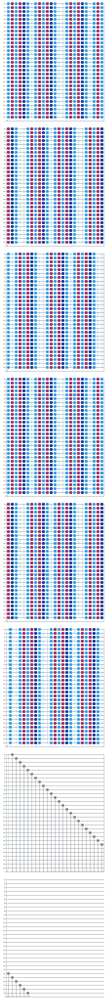

In [ ]:
# draw the circuit
circuit.draw(output='mpl')

In [ ]:
# check Jobs current status
is_completed = job_result.ok
print(is_completed)

True


In [ ]:


# retrieve the measurement probabilities of the computation result
measurement_probabilities = job_result.get_counts()
print(f"probabilities for the measurements in the output register: {measurement_probabilities}")





probabilities for the measurements in the output register: {'000000000000000001000110100100': 9.193840355692373e-07, '000000000000000111000110100100': 9.99424855763209e-07, '000000000000001001000110100100': 1.0745959571067942e-06, '000000000000010101000110100100': 1.0241459449389367e-06, '000000000000100001000110100100': 7.869800242588099e-07, '000000000000100011000110100100': 4.4993925030212267e-07, '000000000000100111000110100100': 6.50765969112399e-07, '000000000000110101000110100100': 1.4448263527810923e-06, '000000000000111001000110100100': 4.75272656785819e-07, '000000000000111011000110100100': 9.206877393808099e-07, '000000000001001101000110100100': 1.0826098559846287e-06, '000000000001110101000110100100': 5.108374807605287e-06, '000000000001111101000110100100': 4.960596129421901e-07, '000000000010001101000110100100': 1.9881811113009462e-06, '000000000010010101000110100100': 1.3507169569493271e-06, '000000000010011101000110100100': 5.384308110478742e-07, '00000000001010100100011

### Plot the Top bitString ###

In [ ]:
# Plot the bitStrings with the highest probabilities for the measurements to see if the hidden bitString was the mode
import matplotlib.pyplot as plt
def plot_top_bitstrings(prob_dict, hidden_bitstring=None):
  # sort and take the top 100 bitstrings
  top_100 = sorted(prob_dict.items(), key=lambda x: x[1], reverse=True)[:100]
  if not top_100:
    print("No bitstrings found in the input dictionary")
    return
  # unzip the bitstrings and their measurement probabilities
  bitstrings, probabilities = zip(*top_100)
  # Assign colors: purple if the bitstring matches the hidden_bitstring, otherwise gray
  colors = ['gray' for bitstring in bitstrings]
  # Create a bar chart
  plt.figure(figsize=(17, 9))
  plt.bar(range(len(bitstrings)), probabilities, tick_label = bitstrings, color=colors)
  #  rotate  the bitstrings for better readability
  plt.xticks(rotation=90, fontsize=10)
  plt.xlabel('Bitstrings')
  plt.ylabel('Probability')
  plt.title('Top 100 Bitstrings with Highest Probabilities')

  # Display the chart
  plt.tight_layout()
  plt.show()


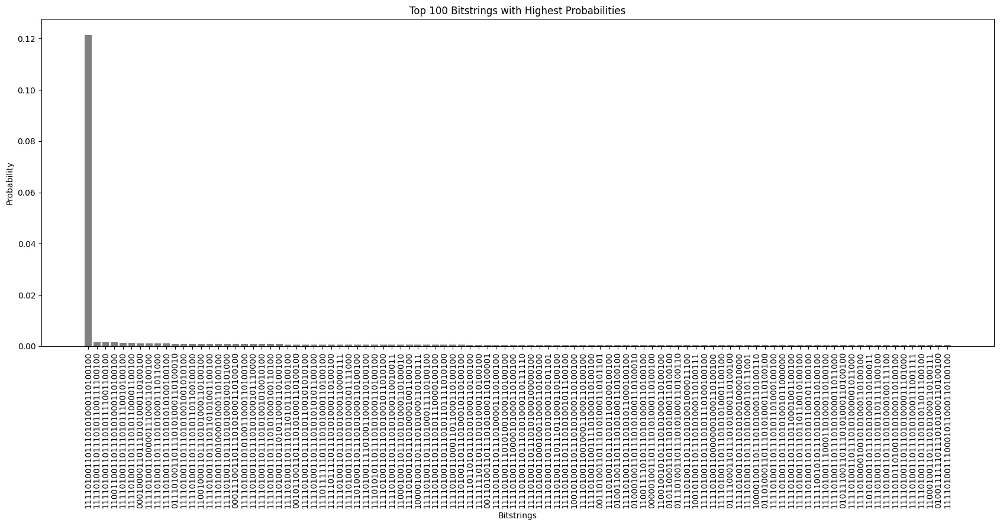

In [ ]:
plot_top_bitstrings(measurement_probabilities)

### The bitstring with the highest probability is hidden bitstring ###

# New Section

# New Section